In [ ]:
import sys
sys.path.insert(0, '/home/i_am_helium/my_libs')

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
import shutil
from scipy import stats

# =========================================================
# CONFIG
# =========================================================

ROOT_DIR = "/home/i_am_helium/skin_clean_R_G_IR"
OUTPUT_DIR = "/home/i_am_helium/skin_clean_R_G_IR_aligned_1" 
REPORT_CSV = "/home/i_am_helium/orientation_report_final_v2.csv"

VALID_CLASSES = ["bcc", "bkl", "mel", "nevus"]

SHOW_EXAMPLES = False  
MAX_EXAMPLES_TO_SHOW = 0

# Delete output directory if it exists
if os.path.exists(OUTPUT_DIR):
    print(f"Deleting existing output directory: {OUTPUT_DIR}")
    shutil.rmtree(OUTPUT_DIR)
    print("Deleted.")

# =========================================================
# ORIENTATION-AWARE FEATURE EXTRACTION
# =========================================================

def read_rgb_image(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


def normalize_gray(img_rgb):
    """Convert to grayscale and normalize robustly"""
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float32)
    p1, p99 = np.percentile(gray, (1, 99))
    if p99 - p1 < 1e-6:
        return np.zeros_like(gray, dtype=np.float32)
    gray = np.clip((gray - p1) / (p99 - p1), 0, 1)
    return gray


def extract_orientation_features(img_rgb):
    """
    Extract features that are sensitive to image orientation:
    1. Directional gradients (horizontal vs vertical)
    2. Corner/marker positions
    3. Asymmetric structure (skin texture patterns)
    4. Edge orientation histogram
    """
    gray = normalize_gray(img_rgb)
    gray_u8 = (gray * 255).astype(np.uint8)
    h, w = gray.shape
    
    # Feature 1: Directional gradient magnitudes
    sobelx = cv2.Sobel(gray_u8, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(gray_u8, cv2.CV_64F, 0, 1, ksize=5)
    
    grad_x_mag = np.abs(sobelx)
    grad_y_mag = np.abs(sobely)
    
    # Normalize
    grad_x_mag = grad_x_mag / (grad_x_mag.max() + 1e-6)
    grad_y_mag = grad_y_mag / (grad_y_mag.max() + 1e-6)
    
    # Feature 2: Edge orientation histogram
    gradient_mag = np.sqrt(sobelx**2 + sobely**2)
    gradient_angle = np.arctan2(sobely, sobelx)  # -pi to pi
    
    # Weight by magnitude (strong edges matter more)
    weights = gradient_mag / (gradient_mag.max() + 1e-6)
    
    # Create histogram of orientations (18 bins = 10 degrees each)
    angle_hist, _ = np.histogram(
        gradient_angle.flatten(),
        bins=18,
        range=(-np.pi, np.pi),
        weights=weights.flatten()
    )
    angle_hist = angle_hist / (angle_hist.sum() + 1e-6)
    
    # Feature 3: Regional intensity distribution (quadrants)
    # Divide image into 4 quadrants and compute statistics
    mid_h, mid_w = h // 2, w // 2
    
    quadrants = [
        gray[:mid_h, :mid_w],      # top-left
        gray[:mid_h, mid_w:],      # top-right
        gray[mid_h:, :mid_w],      # bottom-left
        gray[mid_h:, mid_w:]       # bottom-right
    ]
    
    quad_means = np.array([np.mean(q) for q in quadrants])
    quad_stds = np.array([np.std(q) for q in quadrants])
    
    # Feature 4: Detect corner markers (black regions in corners)
    _, binary = cv2.threshold(gray_u8, 25, 255, cv2.THRESH_BINARY_INV)
    
    # Check each corner region (10% of width/height from edges)
    corner_size_h, corner_size_w = int(h * 0.15), int(w * 0.15)
    
    corners = {
        'tl': binary[:corner_size_h, :corner_size_w],           # top-left
        'tr': binary[:corner_size_h, -corner_size_w:],          # top-right
        'bl': binary[-corner_size_h:, :corner_size_w],          # bottom-left
        'br': binary[-corner_size_h:, -corner_size_w:]          # bottom-right
    }
    
    corner_densities = {k: np.mean(v) / 255.0 for k, v in corners.items()}
    corner_vector = np.array([corner_densities[k] for k in ['tl', 'tr', 'bl', 'br']])
    
    # Feature 5: Overall gradient map for pixel-wise comparison
    gradient_map = gradient_mag / (gradient_mag.max() + 1e-6)
    
    return {
        'grad_x': grad_x_mag.astype(np.float32),
        'grad_y': grad_y_mag.astype(np.float32),
        'angle_hist': angle_hist.astype(np.float32),
        'quad_means': quad_means.astype(np.float32),
        'quad_stds': quad_stds.astype(np.float32),
        'corner_vector': corner_vector.astype(np.float32),
        'gradient_map': gradient_map.astype(np.float32),
        'gray': gray
    }


def compute_multi_feature_similarity(ref_features, mov_features):
    """
    Compute comprehensive similarity score using multiple features.
    Lower score = better alignment.
    
    Returns: (total_score, individual_scores_dict)
    """
    scores = {}
    
    h, w = ref_features['gray'].shape
    
    # Ensure all moving features are same size as reference
    if mov_features['grad_x'].shape != (h, w):
        for key in ['grad_x', 'grad_y', 'gradient_map', 'gray']:
            mov_features[key] = cv2.resize(
                mov_features[key], (w, h),
                interpolation=cv2.INTER_LINEAR
            )
    
    # Score 1: Directional gradient similarity (CRITICAL for rotation)
    grad_x_diff = np.mean(np.abs(ref_features['grad_x'] - mov_features['grad_x']))
    grad_y_diff = np.mean(np.abs(ref_features['grad_y'] - mov_features['grad_y']))
    scores['grad_x_diff'] = float(grad_x_diff)
    scores['grad_y_diff'] = float(grad_y_diff)
    
    # Score 2: Orientation histogram similarity
    hist_diff = np.sum(np.abs(ref_features['angle_hist'] - mov_features['angle_hist']))
    scores['hist_diff'] = float(hist_diff)
    
    # Score 3: Quadrant statistics similarity
    quad_mean_diff = np.mean(np.abs(ref_features['quad_means'] - mov_features['quad_means']))
    quad_std_diff = np.mean(np.abs(ref_features['quad_stds'] - mov_features['quad_stds']))
    scores['quad_mean_diff'] = float(quad_mean_diff)
    scores['quad_std_diff'] = float(quad_std_diff)
    
    # Score 4: Corner marker alignment (CRITICAL)
    corner_diff = np.mean(np.abs(ref_features['corner_vector'] - mov_features['corner_vector']))
    scores['corner_diff'] = float(corner_diff)
    
    # Score 5: Overall gradient map similarity
    gradient_map_diff = np.mean(np.abs(ref_features['gradient_map'] - mov_features['gradient_map']))
    scores['gradient_diff'] = float(gradient_map_diff)
    
    # Score 6: Grayscale intensity correlation (secondary)
    ref_flat = ref_features['gray'].flatten()
    mov_flat = mov_features['gray'].flatten()
    correlation = np.corrcoef(ref_flat, mov_flat)[0, 1]
    scores['correlation'] = float(1.0 - correlation)  # lower is better, so invert
    
    # Weighted combination - emphasize directional features
    total_score = (
        0.25 * scores['grad_x_diff'] +
        0.25 * scores['grad_y_diff'] +
        0.15 * scores['hist_diff'] +
        0.10 * scores['corner_diff'] +
        0.15 * scores['gradient_diff'] +
        0.05 * scores['quad_mean_diff'] +
        0.05 * scores['correlation']
    )
    
    return total_score, scores


def apply_transform(img, transform_name):
    """Apply rotation transformation"""
    if transform_name == "identity":
        return img.copy()
    elif transform_name == "rot90":
        return cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    elif transform_name == "rot180":
        return cv2.rotate(img, cv2.ROTATE_180)
    elif transform_name == "rot270":
        return cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
    else:
        raise ValueError(f"Unknown transform: {transform_name}")


def find_best_orientation(reference_img_rgb, moving_img_rgb, channel_name=""):
    """
    Find best orientation alignment using comprehensive feature matching.
    """
    transforms = ["identity", "rot90", "rot180", "rot270"]
    
    ref_features = extract_orientation_features(reference_img_rgb)
    
    results = []
    
    for t in transforms:
        transformed = apply_transform(moving_img_rgb, t)
        
        # Resize if needed
        if transformed.shape[:2] != reference_img_rgb.shape[:2]:
            transformed = cv2.resize(
                transformed,
                (reference_img_rgb.shape[1], reference_img_rgb.shape[0]),
                interpolation=cv2.INTER_LINEAR
            )
        
        mov_features = extract_orientation_features(transformed)
        total_score, individual_scores = compute_multi_feature_similarity(ref_features, mov_features)
        
        results.append({
            'transform': t,
            'total_score': total_score,
            'individual_scores': individual_scores,
            'transformed_img': transformed
        })
    
    # Sort by total score (lower is better)
    results = sorted(results, key=lambda x: x['total_score'])
    
    best = results[0]
    identity = [r for r in results if r['transform'] == 'identity'][0]
    
    improvement = identity['total_score'] - best['total_score']
    improvement_pct = (improvement / (identity['total_score'] + 1e-9)) * 100
    
    # Compute confidence score
    scores_only = [r['total_score'] for r in results]
    score_std = np.std(scores_only)
    score_gap = identity['total_score'] - best['total_score']
    
    # Confidence: how much better is best vs identity, relative to score variance
    confidence = score_gap / (score_std + 1e-6) if score_std > 0 else 0
    
    return {
        "best_transform": best['transform'],
        "best_score": best['total_score'],
        "identity_score": identity['total_score'],
        "improvement": improvement,
        "improvement_pct": improvement_pct,
        "confidence": confidence,
        "corrected_img": best['transformed_img'],
        "individual_scores": best['individual_scores'],
        "all_results": results,
        "channel": channel_name
    }


def decide_correction(result_R, result_IR):
    """
    AGGRESSIVE correction decision - lower thresholds to catch more cases.
    
    Strategy:
    1. ANY non-identity with >1% improvement → apply (very aggressive)
    2. If both agree → almost always apply
    3. Be less conservative overall
    """
    R_transform = result_R['best_transform']
    IR_transform = result_IR['best_transform']
    R_improvement_pct = result_R['improvement_pct']
    IR_improvement_pct = result_IR['improvement_pct']
    R_confidence = result_R['confidence']
    IR_confidence = result_IR['confidence']
    
    correct_R = False
    correct_IR = False
    
    # Strategy 1: Both channels agree on same non-identity transform
    if R_transform == IR_transform and R_transform != "identity":
        # VERY AGGRESSIVE: If both agree, almost always apply
        if R_improvement_pct > 0.5 or IR_improvement_pct > 0.5:  # Lowered from 2%
            correct_R = True
            correct_IR = True
        elif (R_confidence > 0.3 or IR_confidence > 0.3):  # Lowered from 0.5
            correct_R = True
            correct_IR = True
    
    # Strategy 2: Only R channel suggests non-identity
    elif R_transform != "identity" and IR_transform == "identity":
        if R_improvement_pct > 2 and R_confidence > 0.5:  # Lowered from 5% and 1.0
            correct_R = True
        elif R_improvement_pct > 5:  # Lowered from 10%
            correct_R = True
    
    # Strategy 3: Only IR channel suggests non-identity
    elif IR_transform != "identity" and R_transform == "identity":
        if IR_improvement_pct > 2 and IR_confidence > 0.5:  # Lowered from 5% and 1.0
            correct_IR = True
        elif IR_improvement_pct > 5:  # Lowered from 10%
            correct_IR = True
    
    # Strategy 4: Both suggest different non-identity transforms (conflict!)
    elif R_transform != "identity" and IR_transform != "identity" and R_transform != IR_transform:
        # In conflict: go with higher confidence OR higher improvement
        if R_confidence > IR_confidence and R_confidence > 0.8 and R_improvement_pct > 3:  # Lowered thresholds
            correct_R = True
        elif IR_confidence > R_confidence and IR_confidence > 0.8 and IR_improvement_pct > 3:
            correct_IR = True
        elif R_improvement_pct > 8 and R_confidence > 0.5:  # Lowered from 15% and 1.0
            correct_R = True
        elif IR_improvement_pct > 8 and IR_confidence > 0.5:
            correct_IR = True
    
    # REMOVED the override that blocks correction if identity_score < 0.12
    # This was too conservative and missed many cases
    
    return correct_R, correct_IR


def save_rgb_image(path, img_rgb):
    """Save RGB image to disk"""
    os.makedirs(os.path.dirname(path), exist_ok=True)
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(path, img_bgr)


# =========================================================
# VISUALIZATION
# =========================================================

def visualize_detailed_alignment(lesion_id, class_name, G_img, R_img, IR_img, 
                                result_R, result_IR, correct_R, correct_IR):
    """Comprehensive visualization with all diagnostic info"""
    
    R_final = result_R['corrected_img'] if correct_R else R_img
    IR_final = result_IR['corrected_img'] if correct_IR else IR_img
    
    fig = plt.figure(figsize=(22, 13))
    gs = fig.add_gridspec(4, 6, hspace=0.4, wspace=0.3)
    
    # Row 1: Original images
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(R_img)
    ax1.set_title(f'R original\n{result_R["best_transform"]}\n'
                  f'improve: {result_R["improvement_pct"]:.2f}%\n'
                  f'conf: {result_R["confidence"]:.2f}',
                  fontsize=9)
    ax1.axis('off')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(G_img)
    ax2.set_title('G (reference)', fontsize=10, fontweight='bold')
    ax2.axis('off')
    
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(IR_img)
    ax3.set_title(f'IR original\n{result_IR["best_transform"]}\n'
                  f'improve: {result_IR["improvement_pct"]:.2f}%\n'
                  f'conf: {result_IR["confidence"]:.2f}',
                  fontsize=9)
    ax3.axis('off')
    
    # Corrected
    ax4 = fig.add_subplot(gs[0, 3])
    ax4.imshow(R_final)
    status_R = "✓ CORRECTED" if correct_R else "✗ unchanged"
    color_R = 'green' if correct_R else 'gray'
    ax4.set_title(f'R final\n{status_R}', fontsize=9, color=color_R, fontweight='bold')
    ax4.axis('off')
    
    ax5 = fig.add_subplot(gs[0, 4])
    ax5.imshow(G_img)
    ax5.set_title('G (reference)', fontsize=10, fontweight='bold')
    ax5.axis('off')
    
    ax6 = fig.add_subplot(gs[0, 5])
    ax6.imshow(IR_final)
    status_IR = "✓ CORRECTED" if correct_IR else "✗ unchanged"
    color_IR = 'green' if correct_IR else 'gray'
    ax6.set_title(f'IR final\n{status_IR}', fontsize=9, color=color_IR, fontweight='bold')
    ax6.axis('off')
    
    # Row 2: Directional gradients for R
    R_features_orig = extract_orientation_features(R_img)
    R_features_final = extract_orientation_features(R_final)
    G_features = extract_orientation_features(G_img)
    
    ax7 = fig.add_subplot(gs[1, 0])
    ax7.imshow(R_features_orig['grad_x'], cmap='hot')
    ax7.set_title('R grad_x (orig)', fontsize=8)
    ax7.axis('off')
    
    ax8 = fig.add_subplot(gs[1, 1])
    ax8.imshow(G_features['grad_x'], cmap='hot')
    ax8.set_title('G grad_x (ref)', fontsize=8)
    ax8.axis('off')
    
    ax9 = fig.add_subplot(gs[1, 2])
    ax9.imshow(R_features_final['grad_x'], cmap='hot')
    ax9.set_title('R grad_x (final)', fontsize=8)
    ax9.axis('off')
    
    ax10 = fig.add_subplot(gs[1, 3])
    ax10.imshow(R_features_orig['grad_y'], cmap='hot')
    ax10.set_title('R grad_y (orig)', fontsize=8)
    ax10.axis('off')
    
    ax11 = fig.add_subplot(gs[1, 4])
    ax11.imshow(G_features['grad_y'], cmap='hot')
    ax11.set_title('G grad_y (ref)', fontsize=8)
    ax11.axis('off')
    
    ax12 = fig.add_subplot(gs[1, 5])
    ax12.imshow(R_features_final['grad_y'], cmap='hot')
    ax12.set_title('R grad_y (final)', fontsize=8)
    ax12.axis('off')
    
    # Row 3: Directional gradients for IR
    IR_features_orig = extract_orientation_features(IR_img)
    IR_features_final = extract_orientation_features(IR_final)
    
    ax13 = fig.add_subplot(gs[2, 0])
    ax13.imshow(IR_features_orig['grad_x'], cmap='hot')
    ax13.set_title('IR grad_x (orig)', fontsize=8)
    ax13.axis('off')
    
    ax14 = fig.add_subplot(gs[2, 1])
    ax14.imshow(G_features['grad_x'], cmap='hot')
    ax14.set_title('G grad_x (ref)', fontsize=8)
    ax14.axis('off')
    
    ax15 = fig.add_subplot(gs[2, 2])
    ax15.imshow(IR_features_final['grad_x'], cmap='hot')
    ax15.set_title('IR grad_x (final)', fontsize=8)
    ax15.axis('off')
    
    ax16 = fig.add_subplot(gs[2, 3])
    ax16.imshow(IR_features_orig['grad_y'], cmap='hot')
    ax16.set_title('IR grad_y (orig)', fontsize=8)
    ax16.axis('off')
    
    ax17 = fig.add_subplot(gs[2, 4])
    ax17.imshow(G_features['grad_y'], cmap='hot')
    ax17.set_title('G grad_y (ref)', fontsize=8)
    ax17.axis('off')
    
    ax18 = fig.add_subplot(gs[2, 5])
    ax18.imshow(IR_features_final['grad_y'], cmap='hot')
    ax18.set_title('IR grad_y (final)', fontsize=8)
    ax18.axis('off')
    
    # Row 4: Angle histograms and scores
    ax19 = fig.add_subplot(gs[3, 0:2])
    x = np.arange(18)
    width = 0.25
    ax19.bar(x - width, R_features_orig['angle_hist'], width, label='R orig', alpha=0.7)
    ax19.bar(x, G_features['angle_hist'], width, label='G ref', alpha=0.7)
    ax19.bar(x + width, R_features_final['angle_hist'], width, label='R final', alpha=0.7)
    ax19.set_title('R: Orientation histogram', fontsize=9)
    ax19.legend(fontsize=7)
    ax19.set_xlabel('Angle bin', fontsize=7)
    ax19.set_ylabel('Density', fontsize=7)
    
    ax20 = fig.add_subplot(gs[3, 2:4])
    ax20.bar(x - width, IR_features_orig['angle_hist'], width, label='IR orig', alpha=0.7)
    ax20.bar(x, G_features['angle_hist'], width, label='G ref', alpha=0.7)
    ax20.bar(x + width, IR_features_final['angle_hist'], width, label='IR final', alpha=0.7)
    ax20.set_title('IR: Orientation histogram', fontsize=9)
    ax20.legend(fontsize=7)
    ax20.set_xlabel('Angle bin', fontsize=7)
    ax20.set_ylabel('Density', fontsize=7)
    
    # Info box
    ax21 = fig.add_subplot(gs[3, 4:6])
    info_text = (
        f"DECISION ANALYSIS\n"
        f"{'='*50}\n\n"
        f"R Channel:\n"
        f"  Best: {result_R['best_transform']}\n"
        f"  Improvement: {result_R['improvement_pct']:.2f}%\n"
        f"  Confidence: {result_R['confidence']:.2f}\n"
        f"  Identity score: {result_R['identity_score']:.4f}\n"
        f"  Action: {'CORRECTED' if correct_R else 'NO CHANGE'}\n\n"
        f"IR Channel:\n"
        f"  Best: {result_IR['best_transform']}\n"
        f"  Improvement: {result_IR['improvement_pct']:.2f}%\n"
        f"  Confidence: {result_IR['confidence']:.2f}\n"
        f"  Identity score: {result_IR['identity_score']:.4f}\n"
        f"  Action: {'CORRECTED' if correct_IR else 'NO CHANGE'}\n\n"
        f"Agreement: {R_transform == IR_transform if (R_transform := result_R['best_transform']) != 'identity' and (IR_transform := result_IR['best_transform']) != 'identity' else 'N/A'}"
    )
    
    ax21.text(0.05, 0.95, info_text, transform=ax21.transAxes,
             fontsize=8, verticalalignment='top', family='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))
    ax21.axis('off')
    
    fig.suptitle(f'Class: {class_name} | Lesion: {lesion_id}', 
                fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()


# =========================================================
# MAIN PROCESSING
# =========================================================

records = []
shown_examples = 0

class_summary = defaultdict(lambda: {
    "total_lesions": 0,
    "R_corrected": 0,
    "IR_corrected": 0,
    "both_corrected": 0,
    "all_identity": 0,
})

class_names = sorted([
    d for d in os.listdir(ROOT_DIR)
    if os.path.isdir(os.path.join(ROOT_DIR, d)) and d in VALID_CLASSES
])

print("=" * 80)
print("FINAL ROBUST ORIENTATION CORRECTION")
print("Using Orientation-Aware Multi-Feature Matching")
print("=" * 80)
print(f"Root folder: {ROOT_DIR}")
print(f"Output folder: {OUTPUT_DIR}")
print(f"Classes: {class_names}\n")

for class_name in class_names:
    class_path = os.path.join(ROOT_DIR, class_name)
    
    lesion_folders = sorted([
        d for d in os.listdir(class_path)
        if os.path.isdir(os.path.join(class_path, d))
    ])
    
    class_summary[class_name]["total_lesions"] = len(lesion_folders)
    
    print(f"\n{'='*80}")
    print(f"Processing: {class_name} ({len(lesion_folders)} lesions)")
    print(f"{'='*80}")
    
    for idx, lesion_id in enumerate(lesion_folders):
        if (idx + 1) % 100 == 0:
            print(f"  Progress: {idx+1}/{len(lesion_folders)}")
        
        lesion_path = os.path.join(class_path, lesion_id)
        
        required_paths = {
            "R": os.path.join(lesion_path, "R.png"),
            "G": os.path.join(lesion_path, "G.png"),
            "IR": os.path.join(lesion_path, "IR.png"),
        }
        
        # Check if all channels exist
        if not all(os.path.exists(p) for p in required_paths.values()):
            records.append({
                "class": class_name,
                "lesion_id": lesion_id,
                "status": "skipped_missing_channel",
                "R_best_transform": "",
                "R_identity_score": np.nan,
                "R_best_score": np.nan,
                "R_improvement_pct": np.nan,
                "R_confidence": np.nan,
                "R_corrected": False,
                "IR_best_transform": "",
                "IR_identity_score": np.nan,
                "IR_best_score": np.nan,
                "IR_improvement_pct": np.nan,
                "IR_confidence": np.nan,
                "IR_corrected": False
            })
            continue
        
        try:
            R_img = read_rgb_image(required_paths["R"])
            G_img = read_rgb_image(required_paths["G"])
            IR_img = read_rgb_image(required_paths["IR"])
        except Exception as e:
            print(f"  ERROR reading {lesion_id}: {e}")
            records.append({
                "class": class_name,
                "lesion_id": lesion_id,
                "status": "error_reading",
                "R_best_transform": "",
                "R_identity_score": np.nan,
                "R_best_score": np.nan,
                "R_improvement_pct": np.nan,
                "R_confidence": np.nan,
                "R_corrected": False,
                "IR_best_transform": "",
                "IR_identity_score": np.nan,
                "IR_best_score": np.nan,
                "IR_improvement_pct": np.nan,
                "IR_confidence": np.nan,
                "IR_corrected": False
            })
            continue
        
        # Find best orientations
        result_R = find_best_orientation(G_img, R_img, channel_name="R")
        result_IR = find_best_orientation(G_img, IR_img, channel_name="IR")
        
        # Decide correction
        correct_R, correct_IR = decide_correction(result_R, result_IR)
        
        # Get final images
        R_final = result_R['corrected_img'] if correct_R else R_img
        IR_final = result_IR['corrected_img'] if correct_IR else IR_img
        
        # Save to output directory
        out_lesion_dir = os.path.join(OUTPUT_DIR, class_name, lesion_id)
        os.makedirs(out_lesion_dir, exist_ok=True)
        
        save_rgb_image(os.path.join(out_lesion_dir, "G.png"), G_img)
        save_rgb_image(os.path.join(out_lesion_dir, "R.png"), R_final)
        save_rgb_image(os.path.join(out_lesion_dir, "IR.png"), IR_final)
        
        # Update summary
        if correct_R:
            class_summary[class_name]["R_corrected"] += 1
        if correct_IR:
            class_summary[class_name]["IR_corrected"] += 1
        if correct_R and correct_IR:
            class_summary[class_name]["both_corrected"] += 1
        if (not correct_R) and (not correct_IR):
            class_summary[class_name]["all_identity"] += 1
        
        # Record results
        records.append({
            "class": class_name,
            "lesion_id": lesion_id,
            "status": "processed",
            "R_best_transform": result_R["best_transform"],
            "R_identity_score": result_R["identity_score"],
            "R_best_score": result_R["best_score"],
            "R_improvement_pct": result_R["improvement_pct"],
            "R_confidence": result_R["confidence"],
            "R_corrected": correct_R,
            "IR_best_transform": result_IR["best_transform"],
            "IR_identity_score": result_IR["identity_score"],
            "IR_best_score": result_IR["best_score"],
            "IR_improvement_pct": result_IR["improvement_pct"],
            "IR_confidence": result_IR["confidence"],
            "IR_corrected": correct_IR
        })
        
        # Visualize interesting cases
        if SHOW_EXAMPLES and shown_examples < MAX_EXAMPLES_TO_SHOW:
            # Show cases that were corrected OR borderline cases
            show_this = (
                correct_R or correct_IR or
                (result_R['improvement_pct'] > 3 and result_R['best_transform'] != 'identity') or
                (result_IR['improvement_pct'] > 3 and result_IR['best_transform'] != 'identity')
            )
            
            if show_this:
                print(f"\n  Visualizing: {lesion_id}")
                visualize_detailed_alignment(
                    lesion_id, class_name, G_img, R_img, IR_img,
                    result_R, result_IR, correct_R, correct_IR
                )
                shown_examples += 1

# =========================================================
# SAVE REPORT
# =========================================================

df_report = pd.DataFrame(records)
df_report.to_csv(REPORT_CSV, index=False)

summary_df = pd.DataFrame.from_dict(class_summary, orient="index").reset_index()
summary_df = summary_df.rename(columns={"index": "class"})

print("\n" + "=" * 80)
print("FINAL SUMMARY")
print("=" * 80)
print(summary_df.to_string(index=False))

print(f"\n✓ Report saved to: {REPORT_CSV}")
print(f"✓ Corrected dataset saved to: {OUTPUT_DIR}")

# Show corrected lesions
corrected_df = df_report[
    (df_report["R_corrected"] == True) | (df_report["IR_corrected"] == True)
].copy()

print(f"\n{'='*80}")
print(f"CORRECTED LESIONS: {len(corrected_df)}")
print(f"{'='*80}")
if len(corrected_df) > 0:
    display_cols = [
        'class', 'lesion_id', 
        'R_best_transform', 'R_improvement_pct', 'R_confidence', 'R_corrected',
        'IR_best_transform', 'IR_improvement_pct', 'IR_confidence', 'IR_corrected'
    ]
    print(corrected_df[display_cols].head(50).to_string(index=False))

print("\n" + "=" * 80)
print("✓ PROCESSING COMPLETE!")
print("=" * 80)

FINAL ROBUST ORIENTATION CORRECTION
Using Orientation-Aware Multi-Feature Matching
Root folder: /home/i_am_helium/skin_clean_R_G_IR
Output folder: /home/i_am_helium/skin_clean_R_G_IR_aligned_1
Classes: ['bcc', 'bkl', 'mel', 'nevus']


Processing: bcc (450 lesions)
  Progress: 100/450
  Progress: 200/450
  Progress: 300/450
  Progress: 400/450

Processing: bkl (250 lesions)
  Progress: 100/250
  Progress: 100/538
  Progress: 200/538
  Progress: 300/538
  Progress: 400/538
  Progress: 500/538

Processing: nevus (527 lesions)
  Progress: 100/527
  Progress: 200/527
  Progress: 300/527


In [2]:
import sys
sys.path.insert(0, '/home/i_am_helium/my_libs')

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# CONFIG: TEST ONE LESION ONLY
# =========================================================

LESION_DIR = "/home/i_am_helium/skin_clean_R_G_IR/bcc/2_193_15_in_1622_1623___2019-03-25_09-54-28"

R_PATH = os.path.join(LESION_DIR, "R.png")
G_PATH = os.path.join(LESION_DIR, "G.png")
IR_PATH = os.path.join(LESION_DIR, "IR.png")

print("Checking files:")
print("R exists:", os.path.exists(R_PATH), R_PATH)
print("G exists:", os.path.exists(G_PATH), G_PATH)
print("IR exists:", os.path.exists(IR_PATH), IR_PATH)

if not os.path.exists(R_PATH):
    raise FileNotFoundError(f"Missing R.png: {R_PATH}")
if not os.path.exists(G_PATH):
    raise FileNotFoundError(f"Missing G.png: {G_PATH}")
if not os.path.exists(IR_PATH):
    raise FileNotFoundError(f"Missing IR.png: {IR_PATH}")


# =========================================================
# READ IMAGE
# =========================================================

def read_rgb_image(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


R_img = read_rgb_image(R_PATH)
G_img = read_rgb_image(G_PATH)
IR_img = read_rgb_image(IR_PATH)

print("\nImage shapes:")
print("R:", R_img.shape)
print("G:", G_img.shape)
print("IR:", IR_img.shape)

Checking files:
R exists: True /home/i_am_helium/skin_clean_R_G_IR/bcc/2_193_15_in_1622_1623___2019-03-25_09-54-28/R.png
G exists: True /home/i_am_helium/skin_clean_R_G_IR/bcc/2_193_15_in_1622_1623___2019-03-25_09-54-28/G.png
IR exists: True /home/i_am_helium/skin_clean_R_G_IR/bcc/2_193_15_in_1622_1623___2019-03-25_09-54-28/IR.png

Image shapes:
R: (466, 448, 3)
G: (466, 448, 3)
IR: (466, 448, 3)


### DELETE THE FOLDER `/home/i_am_helium/skin_clean_R_G_IR_aligned`

In [3]:
import os
import shutil

OUTPUT_DIR = "/home/i_am_helium/skin_clean_R_G_IR_aligned_1"

if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)
    print(f"Deleted folder: {OUTPUT_DIR}")
else:
    print(f"Folder does not exist: {OUTPUT_DIR}")

Deleted folder: /home/i_am_helium/skin_clean_R_G_IR_aligned_1


### Download thư mục skin

In [6]:
import shutil
import os

# Zip skin_clean_R_G_IR
shutil.make_archive('skin_clean_R_G_IR', 'zip', '/home/i_am_helium', 'skin_clean_R_G_IR')

# Zip skin_clean_R_G_IR_aligned  
shutil.make_archive('skin_clean_R_G_IR_aligned', 'zip', '/home/i_am_helium', 'skin_clean_R_G_IR_aligned')

print("Done! Check the file browser for .zip files")

Done! Check the file browser for .zip files


### Sửa đúng hướng 

FINAL ROBUST ORIENTATION CORRECTION
Using Orientation-Aware Multi-Feature Matching
Root folder: /home/i_am_helium/skin_clean_R_G_IR
Output folder: /home/i_am_helium/skin_clean_R_G_IR_aligned
Classes: ['bcc', 'bkl', 'mel', 'nevus']


Processing: bcc (450 lesions)

  Visualizing: 2_1009_115_in_8307___2023-03-27_12-12-44


/tmp/ipykernel_1663775/2105208760.py:527: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


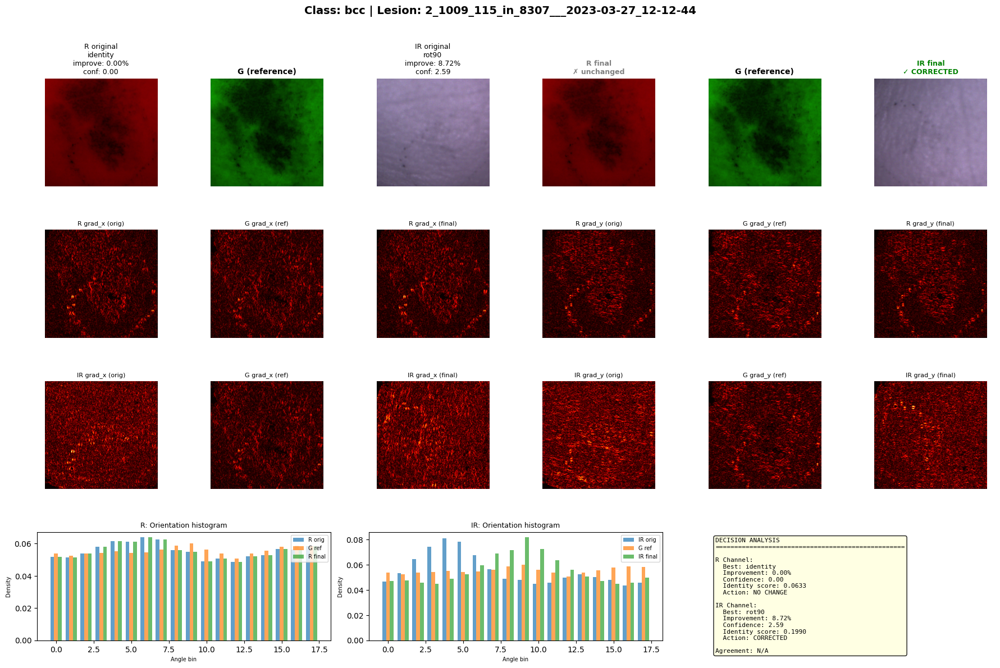


  Visualizing: 2_109_19_in_969_970___2019-02-06_11-32-34


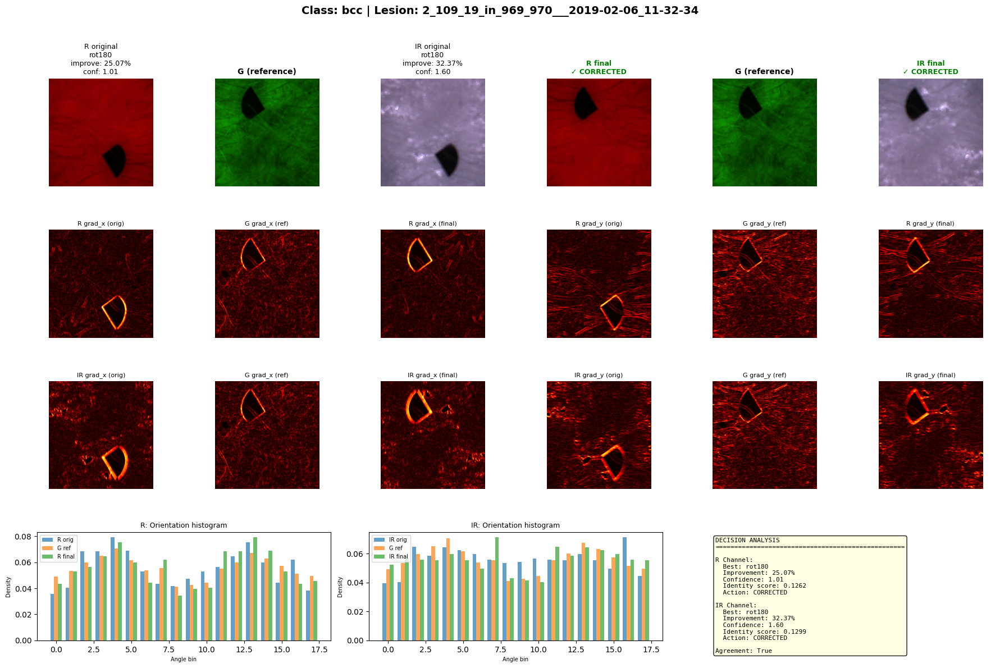


  Visualizing: 2_125_16_in_1116_1117___2019-02-12_11-48-07


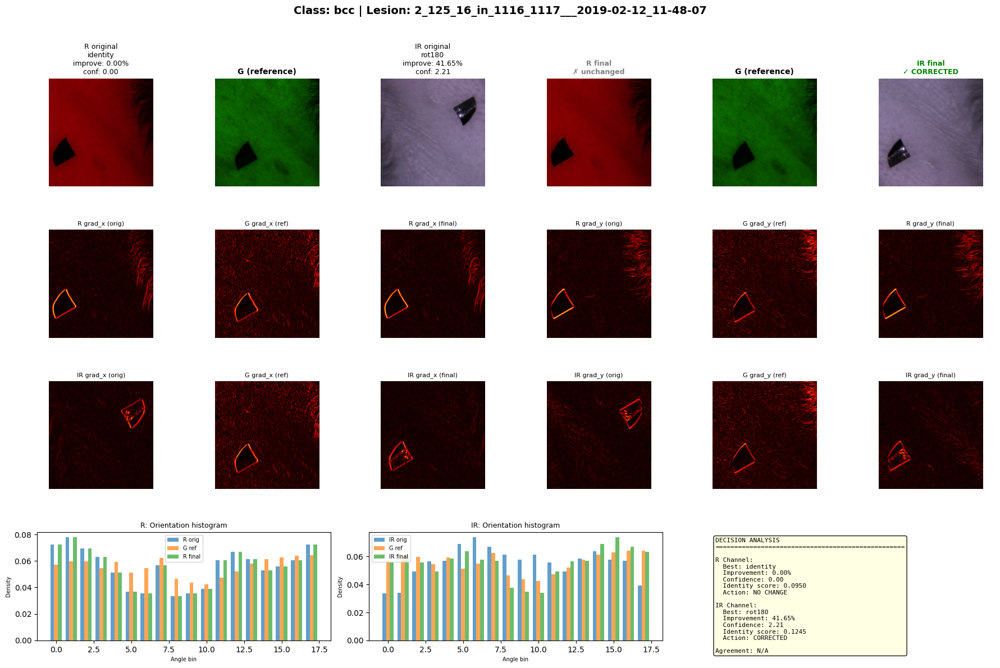


  Visualizing: 2_146_15_in_1286_1287___2019-02-21_10-56-30


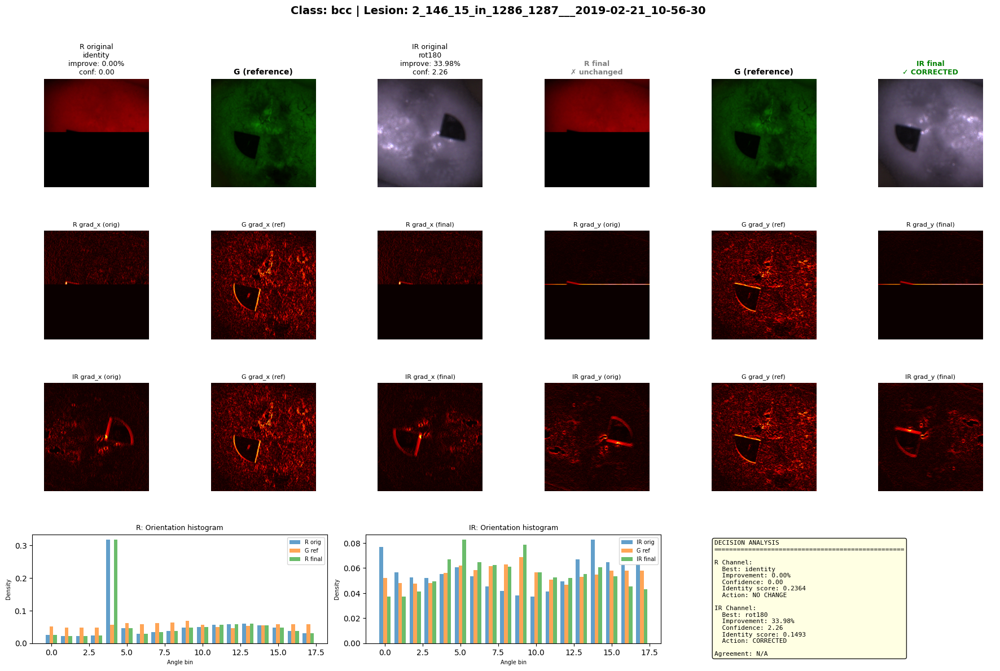


  Visualizing: 2_152_115_in_1310_1311___2019-02-26_12-10-12


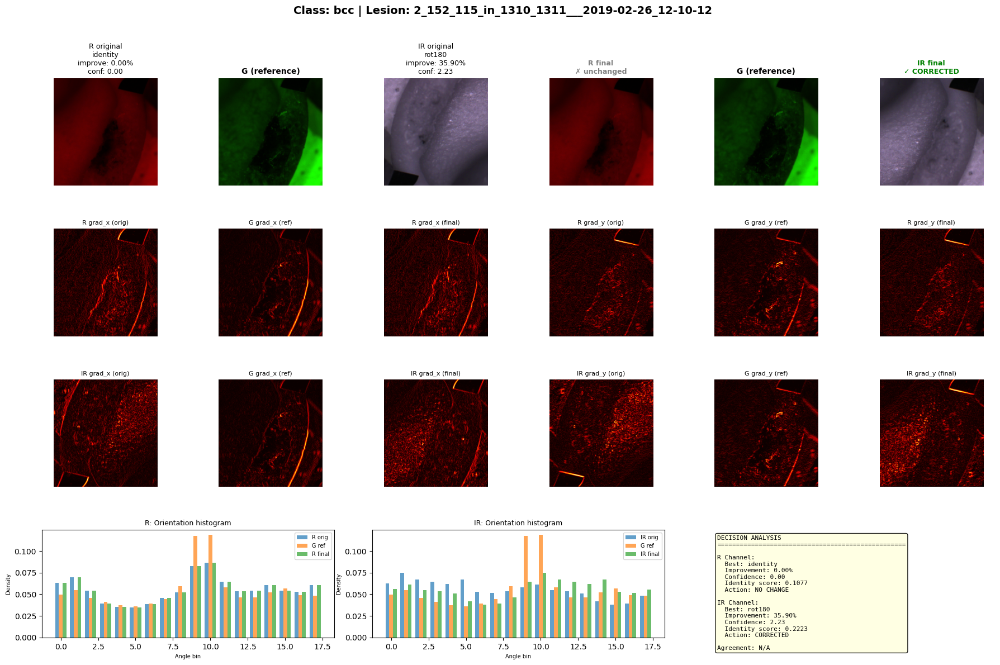


  Visualizing: 2_187_17_in_1528_1529___2019-03-20_12-38-30


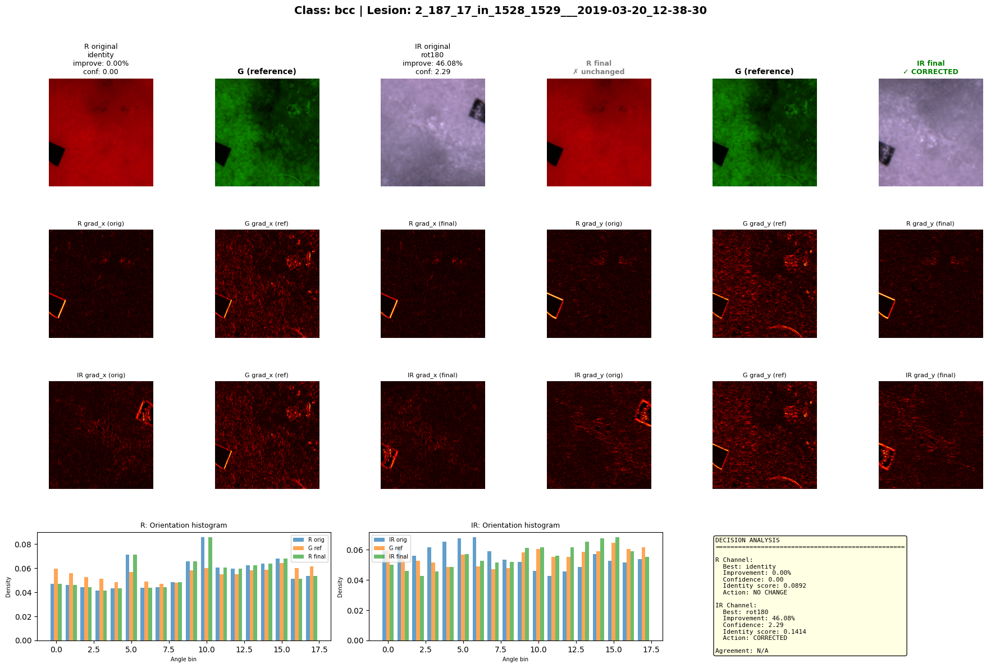


  Visualizing: 2_187_17_in_1530_1531___2019-03-20_12-39-36


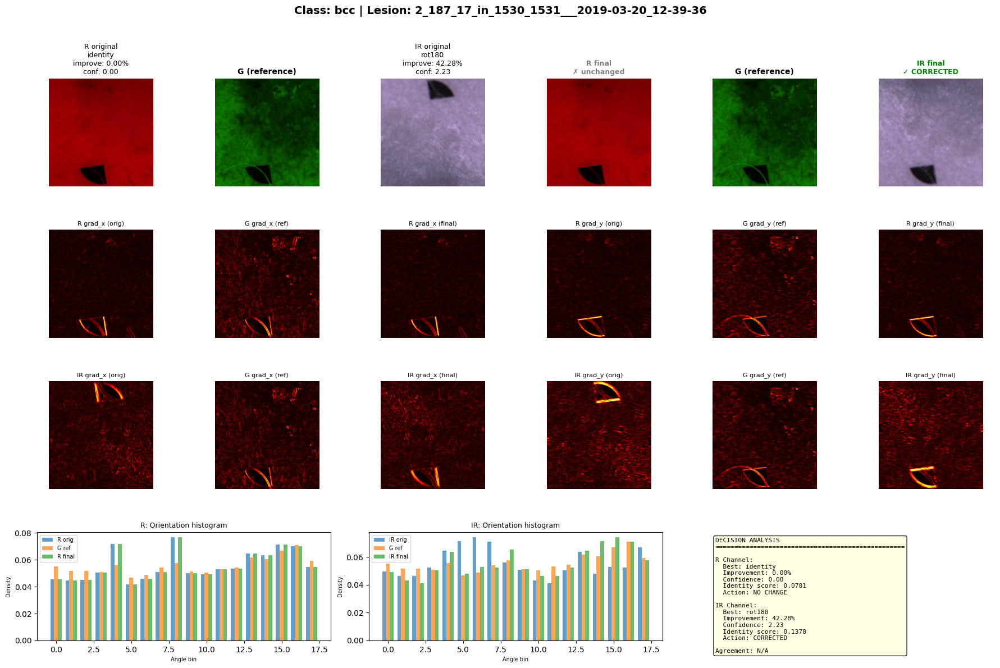


  Visualizing: 2_187_17_in_1532_1533___2019-03-20_12-40-41


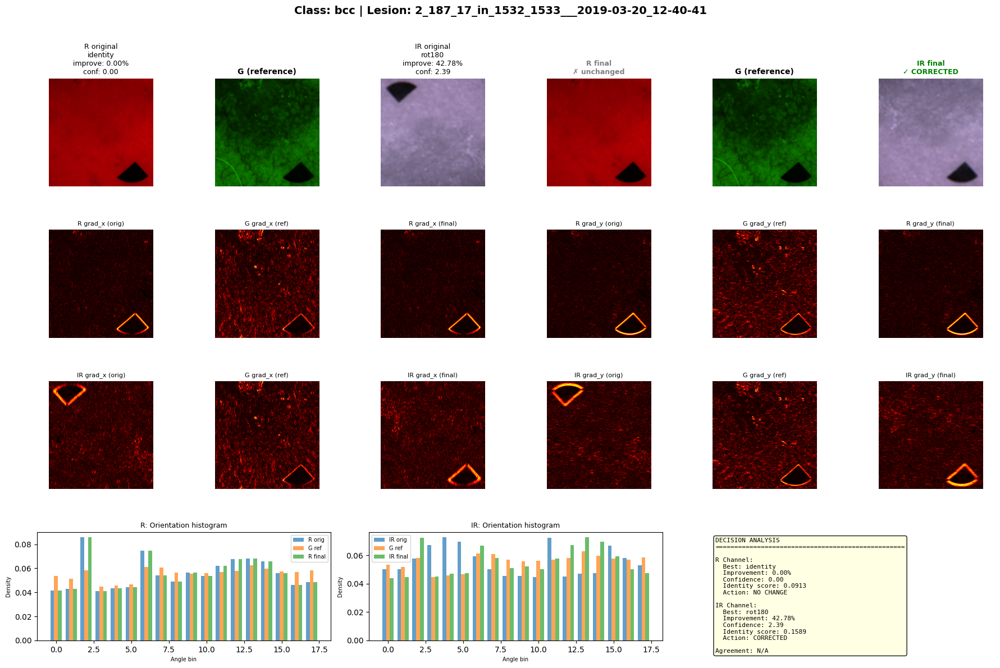


  Visualizing: 2_187_17_in_1534_1535___2019-03-20_12-41-49


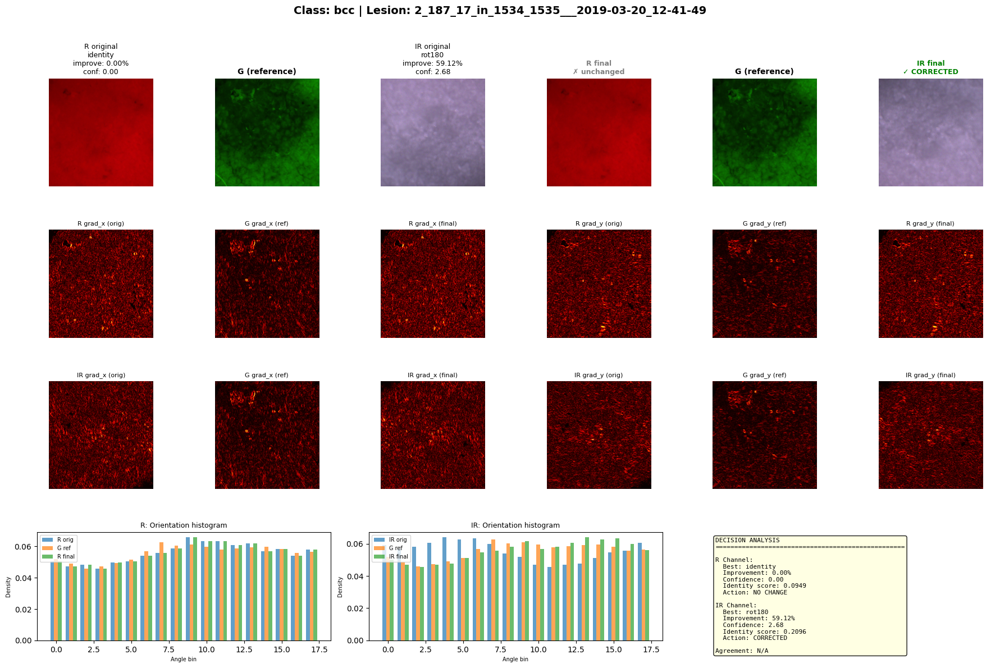


  Visualizing: 2_187_17_in_1536_1537___2019-03-20_12-42-49


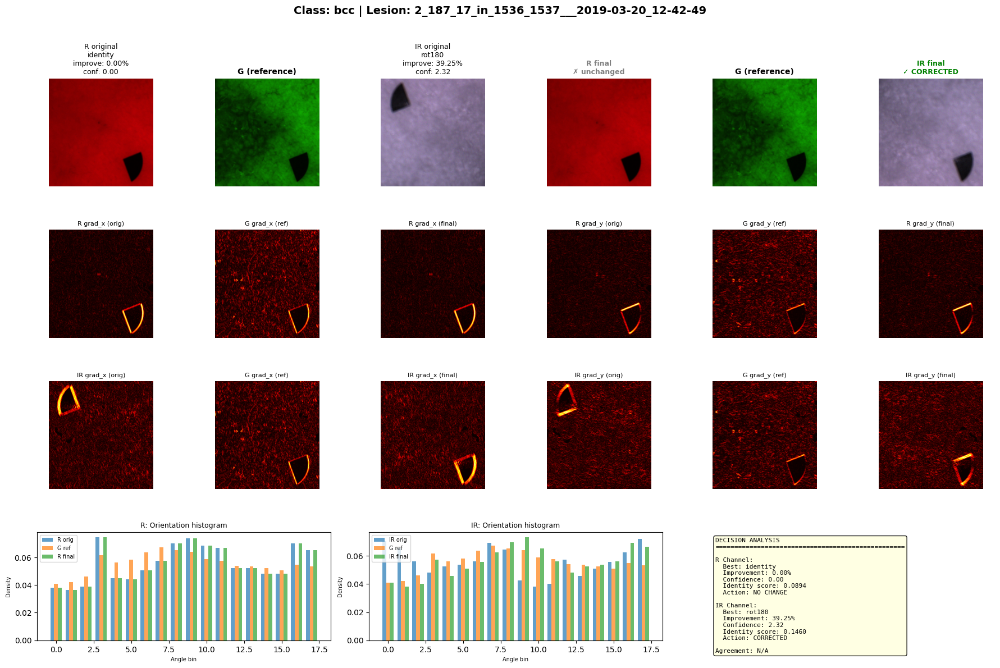


  Visualizing: 2_187_17_in_1540_1541___2019-03-20_12-44-49


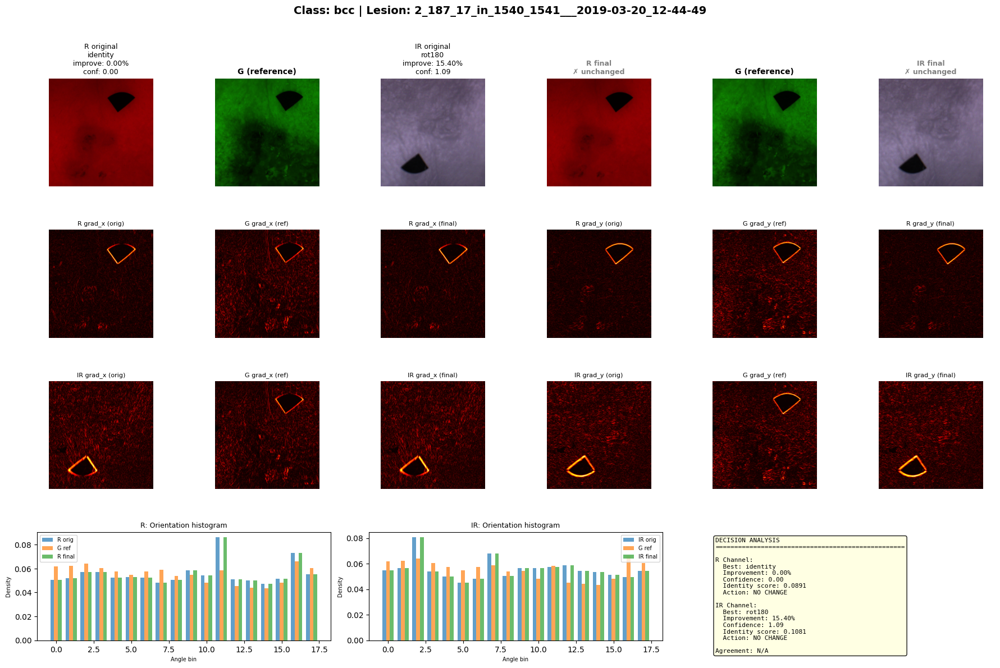


  Visualizing: 2_187_1_in_1526_1527___2019-03-20_12-36-22


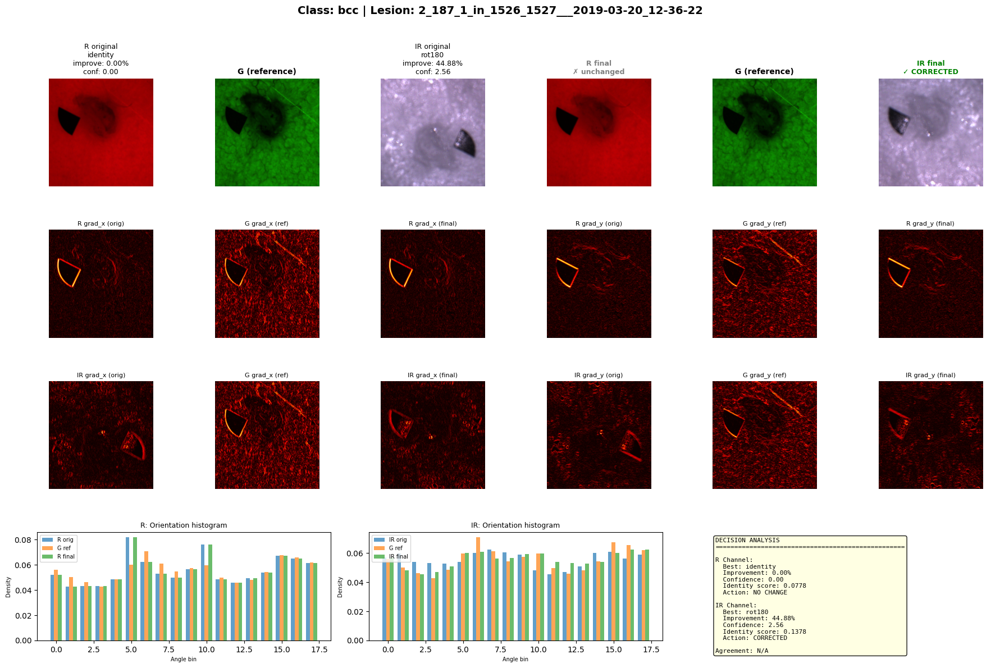


  Visualizing: 2_193_15_in_1616_1617___2019-03-25_09-49-01


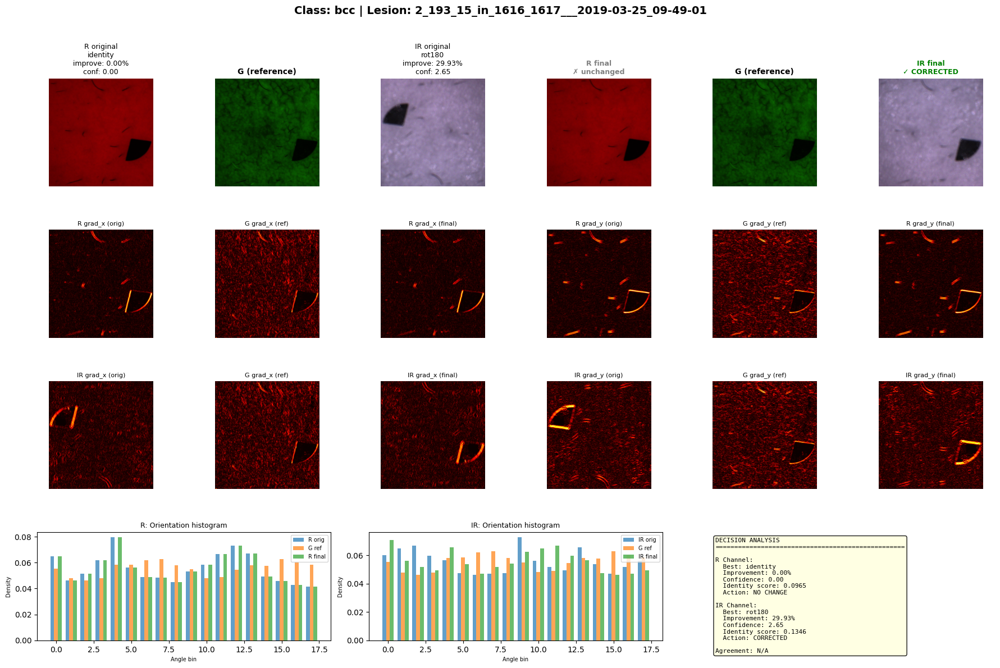


  Visualizing: 2_193_15_in_1622_1623___2019-03-25_09-54-28


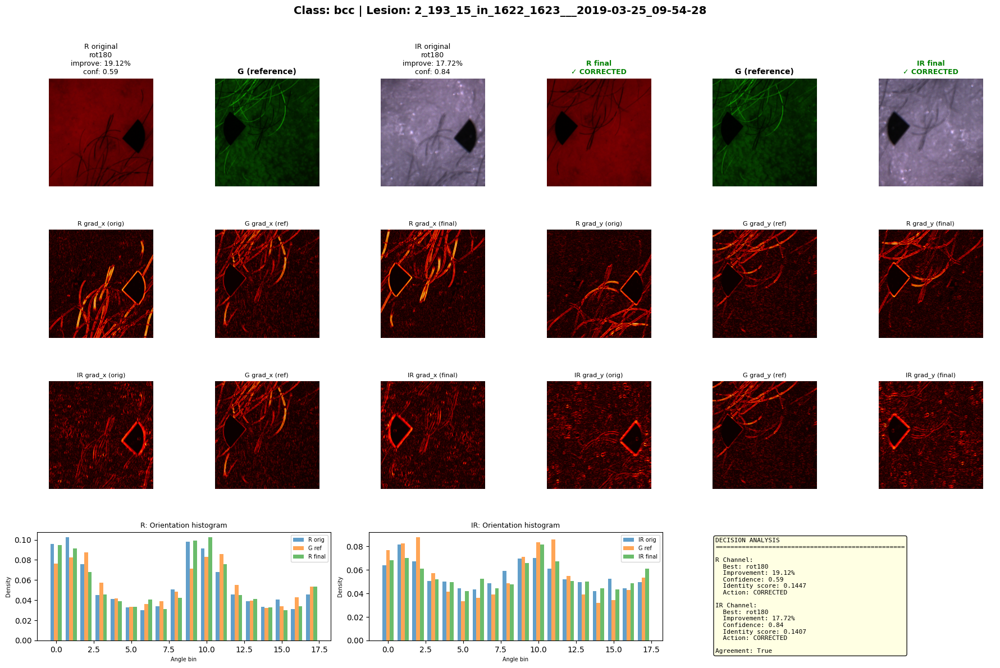


  Visualizing: 2_193_16_in_1624_1625___2019-03-25_09-56-39


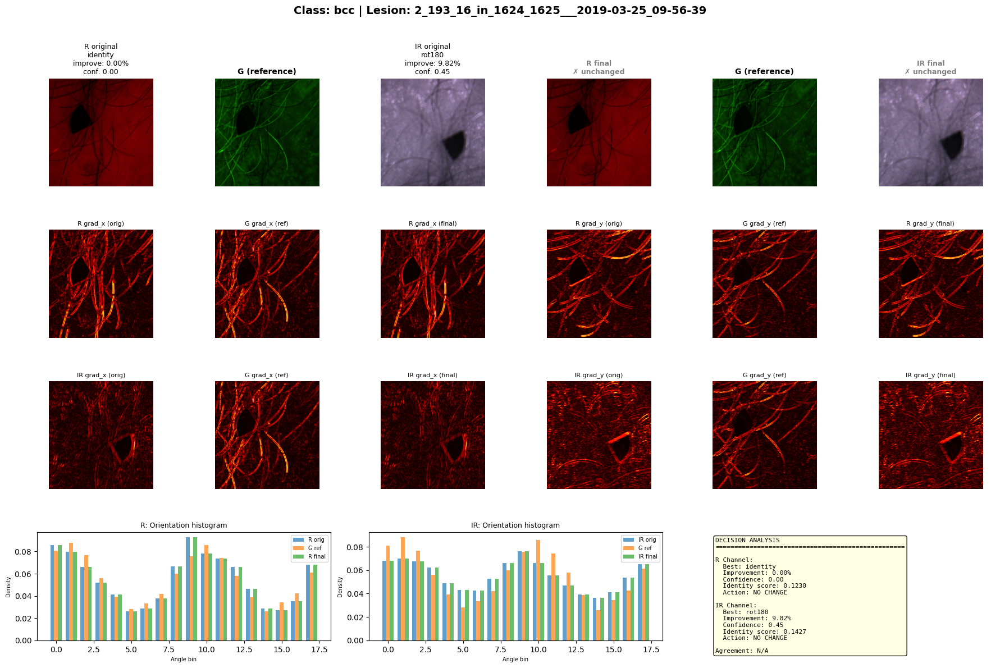


  Visualizing: 2_343_17_in_4712_4713___2020-06-18_13-06-14


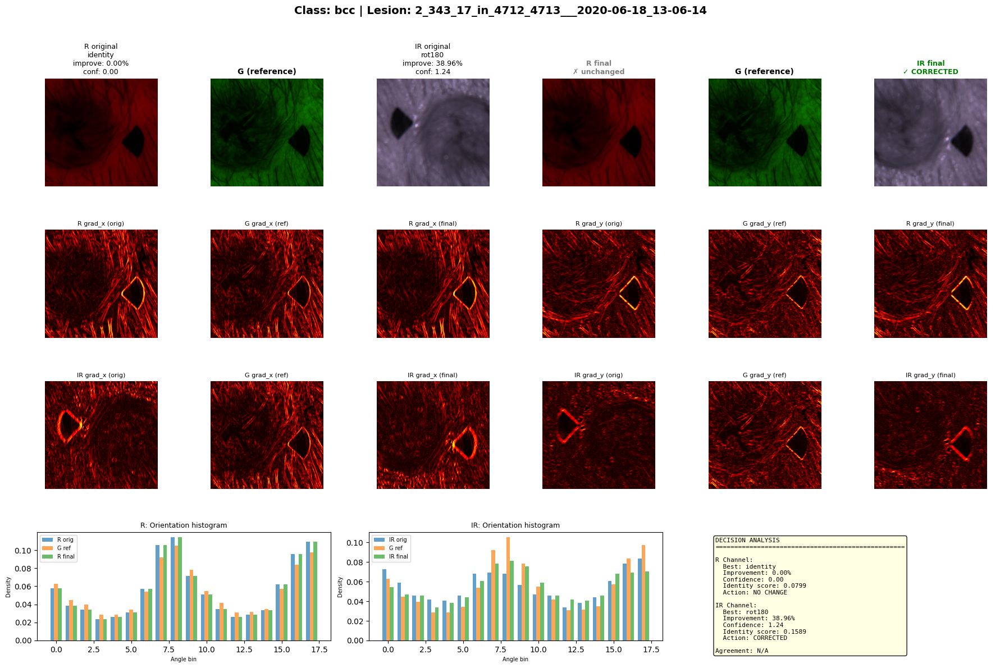


  Visualizing: 2_349_232_in_4732_4733___2020-06-23_13-02-21


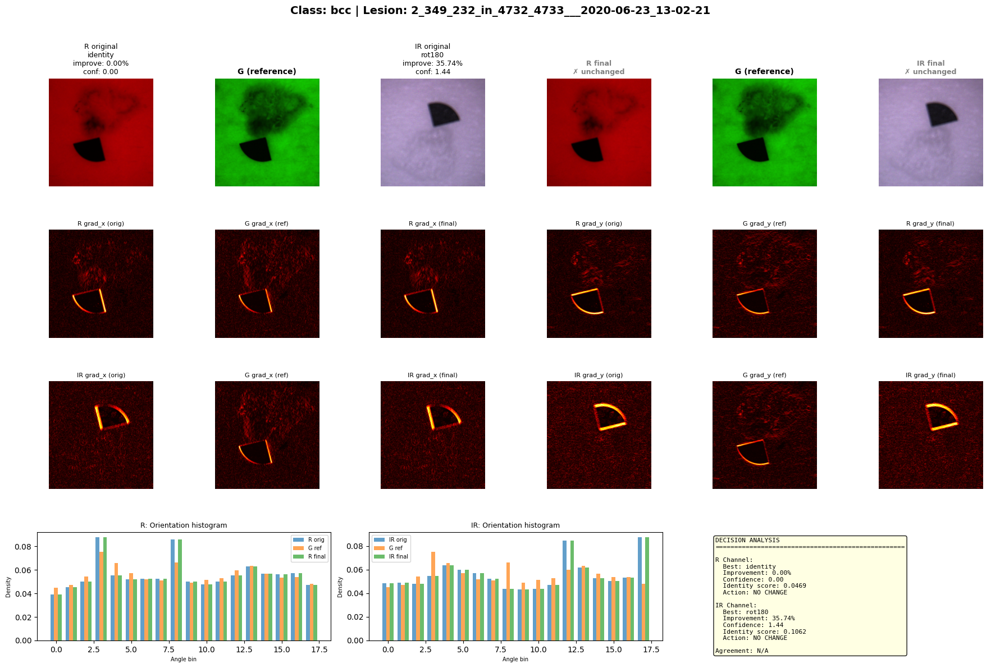


  Visualizing: 2_367_16_in_4790_4791___2020-07-08_10-12-54


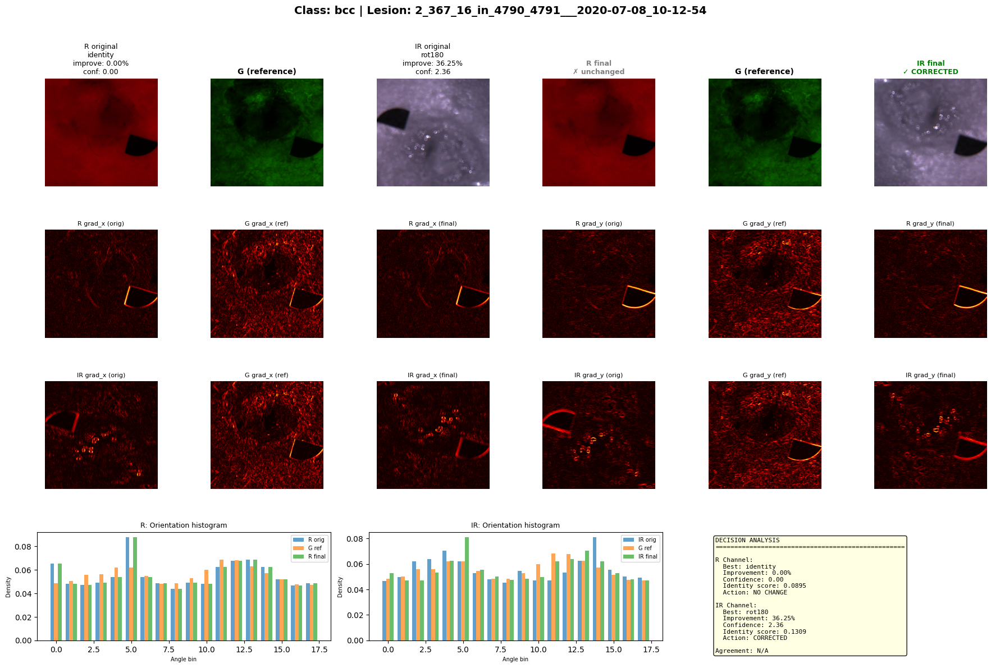

  Progress: 100/450

  Visualizing: 2_384_2_in_4872_4873___2020-07-24_11-31-52


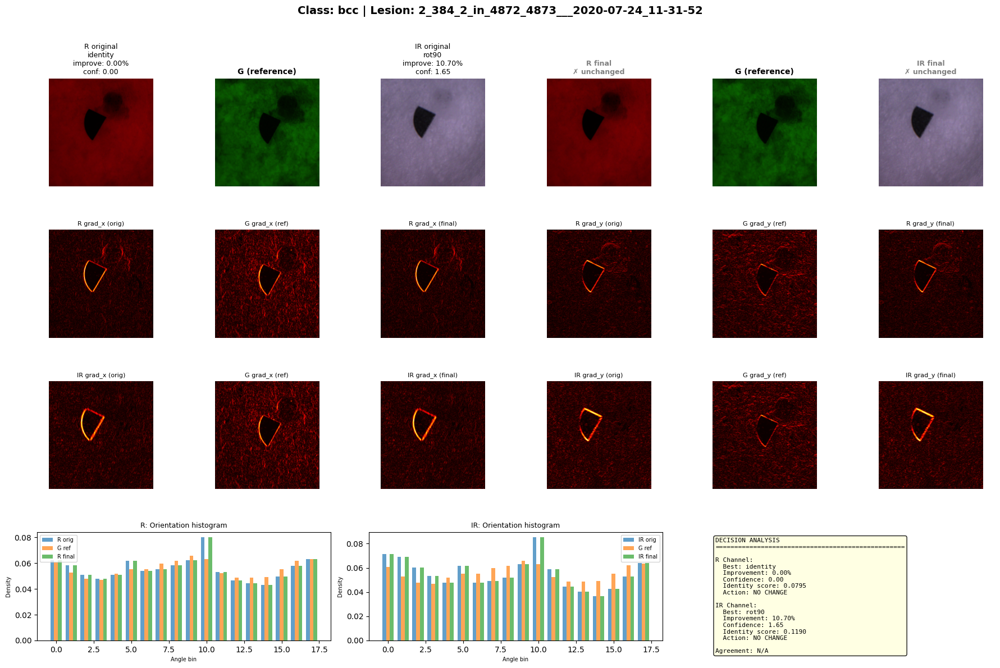


  Visualizing: 2_416_17_in_5020_5021___2020-08-25_11-30-26


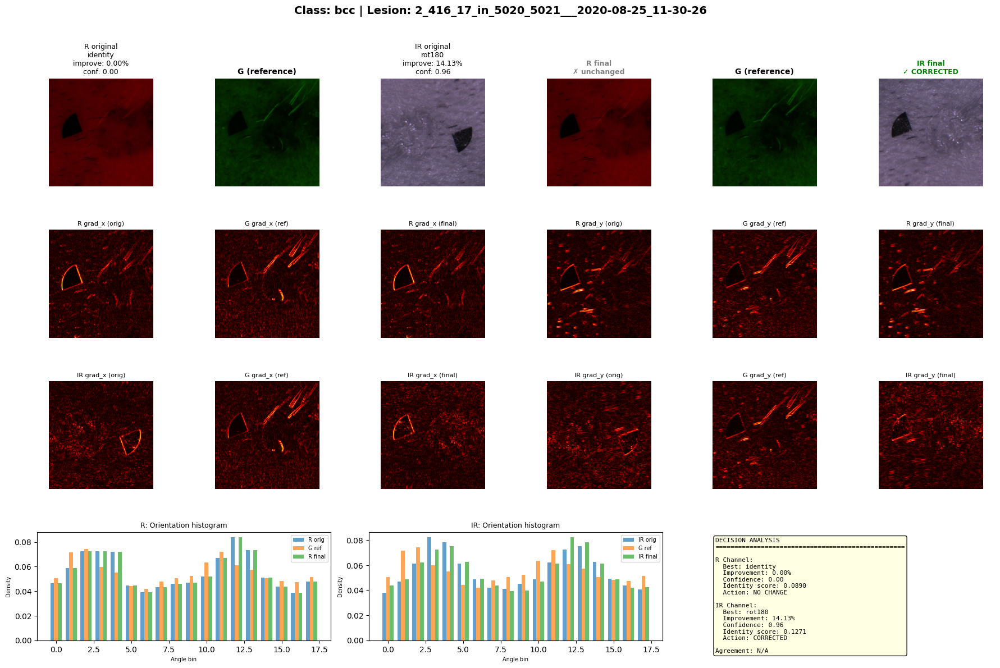

  Progress: 200/450
  Progress: 300/450
  Progress: 400/450

Processing: bkl (250 lesions)
  Progress: 100/250
  Progress: 200/250

Processing: mel (538 lesions)
  Progress: 100/538
  Progress: 200/538
  Progress: 300/538
  Progress: 400/538
  Progress: 500/538

Processing: nevus (527 lesions)
  Progress: 100/527
  Progress: 200/527
  Progress: 300/527
  Progress: 400/527
  Progress: 500/527

FINAL SUMMARY
class  total_lesions  R_corrected  IR_corrected  both_corrected  all_identity
  bcc            450            5            25               2           422
  bkl            250            3             3               2           246
  mel            538            1            52               0           485
nevus            527            2             8               1           518

✓ Report saved to: /home/i_am_helium/orientation_report_final.csv
✓ Corrected dataset saved to: /home/i_am_helium/skin_clean_R_G_IR_aligned

CORRECTED LESIONS: 94
class                               

In [8]:
import sys
sys.path.insert(0, '/home/i_am_helium/my_libs')
 
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
import shutil
from scipy import stats
 
# =========================================================
# CONFIG
# =========================================================
 
ROOT_DIR = "/home/i_am_helium/skin_clean_R_G_IR"
OUTPUT_DIR = "/home/i_am_helium/skin_clean_R_G_IR_aligned"
REPORT_CSV = "/home/i_am_helium/orientation_report_final.csv"
 
VALID_CLASSES = ["bcc", "bkl", "mel", "nevus"]
 
SHOW_EXAMPLES = True
MAX_EXAMPLES_TO_SHOW = 20
 
# Delete output directory if it exists
if os.path.exists(OUTPUT_DIR):
    print(f"Deleting existing output directory: {OUTPUT_DIR}")
    shutil.rmtree(OUTPUT_DIR)
    print("Deleted.")
 
# =========================================================
# ORIENTATION-AWARE FEATURE EXTRACTION
# =========================================================
 
def read_rgb_image(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"Cannot read image: {path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img
 
 
def normalize_gray(img_rgb):
    """Convert to grayscale and normalize robustly"""
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float32)
    p1, p99 = np.percentile(gray, (1, 99))
    if p99 - p1 < 1e-6:
        return np.zeros_like(gray, dtype=np.float32)
    gray = np.clip((gray - p1) / (p99 - p1), 0, 1)
    return gray
 
 
def extract_orientation_features(img_rgb):
    """
    Extract features that are sensitive to image orientation:
    1. Directional gradients (horizontal vs vertical)
    2. Corner/marker positions
    3. Asymmetric structure (skin texture patterns)
    4. Edge orientation histogram
    """
    gray = normalize_gray(img_rgb)
    gray_u8 = (gray * 255).astype(np.uint8)
    h, w = gray.shape
    
    # Feature 1: Directional gradient magnitudes
    sobelx = cv2.Sobel(gray_u8, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(gray_u8, cv2.CV_64F, 0, 1, ksize=5)
    
    grad_x_mag = np.abs(sobelx)
    grad_y_mag = np.abs(sobely)
    
    # Normalize
    grad_x_mag = grad_x_mag / (grad_x_mag.max() + 1e-6)
    grad_y_mag = grad_y_mag / (grad_y_mag.max() + 1e-6)
    
    # Feature 2: Edge orientation histogram
    gradient_mag = np.sqrt(sobelx**2 + sobely**2)
    gradient_angle = np.arctan2(sobely, sobelx)  # -pi to pi
    
    # Weight by magnitude (strong edges matter more)
    weights = gradient_mag / (gradient_mag.max() + 1e-6)
    
    # Create histogram of orientations (18 bins = 10 degrees each)
    angle_hist, _ = np.histogram(
        gradient_angle.flatten(),
        bins=18,
        range=(-np.pi, np.pi),
        weights=weights.flatten()
    )
    angle_hist = angle_hist / (angle_hist.sum() + 1e-6)
    
    # Feature 3: Regional intensity distribution (quadrants)
    # Divide image into 4 quadrants and compute statistics
    mid_h, mid_w = h // 2, w // 2
    
    quadrants = [
        gray[:mid_h, :mid_w],      # top-left
        gray[:mid_h, mid_w:],      # top-right
        gray[mid_h:, :mid_w],      # bottom-left
        gray[mid_h:, mid_w:]       # bottom-right
    ]
    
    quad_means = np.array([np.mean(q) for q in quadrants])
    quad_stds = np.array([np.std(q) for q in quadrants])
    
    # Feature 4: Detect corner markers (black regions in corners)
    _, binary = cv2.threshold(gray_u8, 25, 255, cv2.THRESH_BINARY_INV)
    
    # Check each corner region (10% of width/height from edges)
    corner_size_h, corner_size_w = int(h * 0.15), int(w * 0.15)
    
    corners = {
        'tl': binary[:corner_size_h, :corner_size_w],           # top-left
        'tr': binary[:corner_size_h, -corner_size_w:],          # top-right
        'bl': binary[-corner_size_h:, :corner_size_w],          # bottom-left
        'br': binary[-corner_size_h:, -corner_size_w:]          # bottom-right
    }
    
    corner_densities = {k: np.mean(v) / 255.0 for k, v in corners.items()}
    corner_vector = np.array([corner_densities[k] for k in ['tl', 'tr', 'bl', 'br']])
    
    # Feature 5: Overall gradient map for pixel-wise comparison
    gradient_map = gradient_mag / (gradient_mag.max() + 1e-6)
    
    return {
        'grad_x': grad_x_mag.astype(np.float32),
        'grad_y': grad_y_mag.astype(np.float32),
        'angle_hist': angle_hist.astype(np.float32),
        'quad_means': quad_means.astype(np.float32),
        'quad_stds': quad_stds.astype(np.float32),
        'corner_vector': corner_vector.astype(np.float32),
        'gradient_map': gradient_map.astype(np.float32),
        'gray': gray
    }
 
 
def compute_multi_feature_similarity(ref_features, mov_features):
    """
    Compute comprehensive similarity score using multiple features.
    Lower score = better alignment.
    
    Returns: (total_score, individual_scores_dict)
    """
    scores = {}
    
    h, w = ref_features['gray'].shape
    
    # Ensure all moving features are same size as reference
    if mov_features['grad_x'].shape != (h, w):
        for key in ['grad_x', 'grad_y', 'gradient_map', 'gray']:
            mov_features[key] = cv2.resize(
                mov_features[key], (w, h),
                interpolation=cv2.INTER_LINEAR
            )
    
    # Score 1: Directional gradient similarity (CRITICAL for rotation)
    grad_x_diff = np.mean(np.abs(ref_features['grad_x'] - mov_features['grad_x']))
    grad_y_diff = np.mean(np.abs(ref_features['grad_y'] - mov_features['grad_y']))
    scores['grad_x_diff'] = float(grad_x_diff)
    scores['grad_y_diff'] = float(grad_y_diff)
    
    # Score 2: Orientation histogram similarity
    hist_diff = np.sum(np.abs(ref_features['angle_hist'] - mov_features['angle_hist']))
    scores['hist_diff'] = float(hist_diff)
    
    # Score 3: Quadrant statistics similarity
    quad_mean_diff = np.mean(np.abs(ref_features['quad_means'] - mov_features['quad_means']))
    quad_std_diff = np.mean(np.abs(ref_features['quad_stds'] - mov_features['quad_stds']))
    scores['quad_mean_diff'] = float(quad_mean_diff)
    scores['quad_std_diff'] = float(quad_std_diff)
    
    # Score 4: Corner marker alignment (CRITICAL)
    corner_diff = np.mean(np.abs(ref_features['corner_vector'] - mov_features['corner_vector']))
    scores['corner_diff'] = float(corner_diff)
    
    # Score 5: Overall gradient map similarity
    gradient_map_diff = np.mean(np.abs(ref_features['gradient_map'] - mov_features['gradient_map']))
    scores['gradient_diff'] = float(gradient_map_diff)
    
    # Score 6: Grayscale intensity correlation (secondary)
    ref_flat = ref_features['gray'].flatten()
    mov_flat = mov_features['gray'].flatten()
    correlation = np.corrcoef(ref_flat, mov_flat)[0, 1]
    scores['correlation'] = float(1.0 - correlation)  # lower is better, so invert
    
    # Weighted combination - emphasize directional features
    total_score = (
        0.25 * scores['grad_x_diff'] +
        0.25 * scores['grad_y_diff'] +
        0.15 * scores['hist_diff'] +
        0.10 * scores['corner_diff'] +
        0.15 * scores['gradient_diff'] +
        0.05 * scores['quad_mean_diff'] +
        0.05 * scores['correlation']
    )
    
    return total_score, scores
 
 
def apply_transform(img, transform_name):
    """Apply rotation transformation"""
    if transform_name == "identity":
        return img.copy()
    elif transform_name == "rot90":
        return cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    elif transform_name == "rot180":
        return cv2.rotate(img, cv2.ROTATE_180)
    elif transform_name == "rot270":
        return cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
    else:
        raise ValueError(f"Unknown transform: {transform_name}")
 
 
def find_best_orientation(reference_img_rgb, moving_img_rgb, channel_name=""):
    """
    Find best orientation alignment using comprehensive feature matching.
    """
    transforms = ["identity", "rot90", "rot180", "rot270"]
    
    ref_features = extract_orientation_features(reference_img_rgb)
    
    results = []
    
    for t in transforms:
        transformed = apply_transform(moving_img_rgb, t)
        
        # Resize if needed
        if transformed.shape[:2] != reference_img_rgb.shape[:2]:
            transformed = cv2.resize(
                transformed,
                (reference_img_rgb.shape[1], reference_img_rgb.shape[0]),
                interpolation=cv2.INTER_LINEAR
            )
        
        mov_features = extract_orientation_features(transformed)
        total_score, individual_scores = compute_multi_feature_similarity(ref_features, mov_features)
        
        results.append({
            'transform': t,
            'total_score': total_score,
            'individual_scores': individual_scores,
            'transformed_img': transformed
        })
    
    # Sort by total score (lower is better)
    results = sorted(results, key=lambda x: x['total_score'])
    
    best = results[0]
    identity = [r for r in results if r['transform'] == 'identity'][0]
    
    improvement = identity['total_score'] - best['total_score']
    improvement_pct = (improvement / (identity['total_score'] + 1e-9)) * 100
    
    # Compute confidence score
    scores_only = [r['total_score'] for r in results]
    score_std = np.std(scores_only)
    score_gap = identity['total_score'] - best['total_score']
    
    # Confidence: how much better is best vs identity, relative to score variance
    confidence = score_gap / (score_std + 1e-6) if score_std > 0 else 0
    
    return {
        "best_transform": best['transform'],
        "best_score": best['total_score'],
        "identity_score": identity['total_score'],
        "improvement": improvement,
        "improvement_pct": improvement_pct,
        "confidence": confidence,
        "corrected_img": best['transformed_img'],
        "individual_scores": best['individual_scores'],
        "all_results": results,
        "channel": channel_name
    }
 
 
def decide_correction(result_R, result_IR):
    """
    Improved correction decision with multiple strategies.
    
    Strategy:
    1. High confidence + agreement → apply
    2. One channel very confident → apply to that channel
    3. Modest confidence but both agree → apply
    4. Low confidence or conflict → be conservative
    """
    R_transform = result_R['best_transform']
    IR_transform = result_IR['best_transform']
    R_improvement_pct = result_R['improvement_pct']
    IR_improvement_pct = result_IR['improvement_pct']
    R_confidence = result_R['confidence']
    IR_confidence = result_IR['confidence']
    
    correct_R = False
    correct_IR = False
    
    # Strategy 1: Both channels agree on same non-identity transform
    if R_transform == IR_transform and R_transform != "identity":
        # Strong signal if both agree
        if R_improvement_pct > 2 or IR_improvement_pct > 2:
            correct_R = True
            correct_IR = True
        elif (R_confidence > 0.5 or IR_confidence > 0.5):
            # Even with low improvement, if confidence is high
            correct_R = True
            correct_IR = True
    
    # Strategy 2: Only R channel suggests non-identity
    elif R_transform != "identity" and IR_transform == "identity":
        if R_improvement_pct > 5 and R_confidence > 1.0:
            # Strong signal from R only
            correct_R = True
        elif R_improvement_pct > 10:
            # Very clear improvement
            correct_R = True
    
    # Strategy 3: Only IR channel suggests non-identity
    elif IR_transform != "identity" and R_transform == "identity":
        if IR_improvement_pct > 5 and IR_confidence > 1.0:
            # Strong signal from IR only
            correct_IR = True
        elif IR_improvement_pct > 10:
            # Very clear improvement
            correct_IR = True
    
    # Strategy 4: Both suggest different non-identity transforms (conflict!)
    elif R_transform != "identity" and IR_transform != "identity" and R_transform != IR_transform:
        # In conflict: go with higher confidence
        if R_confidence > IR_confidence and R_confidence > 1.5 and R_improvement_pct > 8:
            correct_R = True
        elif IR_confidence > R_confidence and IR_confidence > 1.5 and IR_improvement_pct > 8:
            correct_IR = True
        elif R_improvement_pct > 15 and R_confidence > 1.0:
            correct_R = True
        elif IR_improvement_pct > 15 and IR_confidence > 1.0:
            correct_IR = True
    
    # Override: If identity score is already very good, don't touch it
    if result_R['identity_score'] < 0.12:
        correct_R = False
    if result_IR['identity_score'] < 0.12:
        correct_IR = False
    
    return correct_R, correct_IR
 
 
def save_rgb_image(path, img_rgb):
    """Save RGB image to disk"""
    os.makedirs(os.path.dirname(path), exist_ok=True)
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
    cv2.imwrite(path, img_bgr)
 
 
# =========================================================
# VISUALIZATION
# =========================================================
 
def visualize_detailed_alignment(lesion_id, class_name, G_img, R_img, IR_img, 
                                result_R, result_IR, correct_R, correct_IR):
    """Comprehensive visualization with all diagnostic info"""
    
    R_final = result_R['corrected_img'] if correct_R else R_img
    IR_final = result_IR['corrected_img'] if correct_IR else IR_img
    
    fig = plt.figure(figsize=(22, 13))
    gs = fig.add_gridspec(4, 6, hspace=0.4, wspace=0.3)
    
    # Row 1: Original images
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(R_img)
    ax1.set_title(f'R original\n{result_R["best_transform"]}\n'
                  f'improve: {result_R["improvement_pct"]:.2f}%\n'
                  f'conf: {result_R["confidence"]:.2f}',
                  fontsize=9)
    ax1.axis('off')
    
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(G_img)
    ax2.set_title('G (reference)', fontsize=10, fontweight='bold')
    ax2.axis('off')
    
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.imshow(IR_img)
    ax3.set_title(f'IR original\n{result_IR["best_transform"]}\n'
                  f'improve: {result_IR["improvement_pct"]:.2f}%\n'
                  f'conf: {result_IR["confidence"]:.2f}',
                  fontsize=9)
    ax3.axis('off')
    
    # Corrected
    ax4 = fig.add_subplot(gs[0, 3])
    ax4.imshow(R_final)
    status_R = "✓ CORRECTED" if correct_R else "✗ unchanged"
    color_R = 'green' if correct_R else 'gray'
    ax4.set_title(f'R final\n{status_R}', fontsize=9, color=color_R, fontweight='bold')
    ax4.axis('off')
    
    ax5 = fig.add_subplot(gs[0, 4])
    ax5.imshow(G_img)
    ax5.set_title('G (reference)', fontsize=10, fontweight='bold')
    ax5.axis('off')
    
    ax6 = fig.add_subplot(gs[0, 5])
    ax6.imshow(IR_final)
    status_IR = "✓ CORRECTED" if correct_IR else "✗ unchanged"
    color_IR = 'green' if correct_IR else 'gray'
    ax6.set_title(f'IR final\n{status_IR}', fontsize=9, color=color_IR, fontweight='bold')
    ax6.axis('off')
    
    # Row 2: Directional gradients for R
    R_features_orig = extract_orientation_features(R_img)
    R_features_final = extract_orientation_features(R_final)
    G_features = extract_orientation_features(G_img)
    
    ax7 = fig.add_subplot(gs[1, 0])
    ax7.imshow(R_features_orig['grad_x'], cmap='hot')
    ax7.set_title('R grad_x (orig)', fontsize=8)
    ax7.axis('off')
    
    ax8 = fig.add_subplot(gs[1, 1])
    ax8.imshow(G_features['grad_x'], cmap='hot')
    ax8.set_title('G grad_x (ref)', fontsize=8)
    ax8.axis('off')
    
    ax9 = fig.add_subplot(gs[1, 2])
    ax9.imshow(R_features_final['grad_x'], cmap='hot')
    ax9.set_title('R grad_x (final)', fontsize=8)
    ax9.axis('off')
    
    ax10 = fig.add_subplot(gs[1, 3])
    ax10.imshow(R_features_orig['grad_y'], cmap='hot')
    ax10.set_title('R grad_y (orig)', fontsize=8)
    ax10.axis('off')
    
    ax11 = fig.add_subplot(gs[1, 4])
    ax11.imshow(G_features['grad_y'], cmap='hot')
    ax11.set_title('G grad_y (ref)', fontsize=8)
    ax11.axis('off')
    
    ax12 = fig.add_subplot(gs[1, 5])
    ax12.imshow(R_features_final['grad_y'], cmap='hot')
    ax12.set_title('R grad_y (final)', fontsize=8)
    ax12.axis('off')
    
    # Row 3: Directional gradients for IR
    IR_features_orig = extract_orientation_features(IR_img)
    IR_features_final = extract_orientation_features(IR_final)
    
    ax13 = fig.add_subplot(gs[2, 0])
    ax13.imshow(IR_features_orig['grad_x'], cmap='hot')
    ax13.set_title('IR grad_x (orig)', fontsize=8)
    ax13.axis('off')
    
    ax14 = fig.add_subplot(gs[2, 1])
    ax14.imshow(G_features['grad_x'], cmap='hot')
    ax14.set_title('G grad_x (ref)', fontsize=8)
    ax14.axis('off')
    
    ax15 = fig.add_subplot(gs[2, 2])
    ax15.imshow(IR_features_final['grad_x'], cmap='hot')
    ax15.set_title('IR grad_x (final)', fontsize=8)
    ax15.axis('off')
    
    ax16 = fig.add_subplot(gs[2, 3])
    ax16.imshow(IR_features_orig['grad_y'], cmap='hot')
    ax16.set_title('IR grad_y (orig)', fontsize=8)
    ax16.axis('off')
    
    ax17 = fig.add_subplot(gs[2, 4])
    ax17.imshow(G_features['grad_y'], cmap='hot')
    ax17.set_title('G grad_y (ref)', fontsize=8)
    ax17.axis('off')
    
    ax18 = fig.add_subplot(gs[2, 5])
    ax18.imshow(IR_features_final['grad_y'], cmap='hot')
    ax18.set_title('IR grad_y (final)', fontsize=8)
    ax18.axis('off')
    
    # Row 4: Angle histograms and scores
    ax19 = fig.add_subplot(gs[3, 0:2])
    x = np.arange(18)
    width = 0.25
    ax19.bar(x - width, R_features_orig['angle_hist'], width, label='R orig', alpha=0.7)
    ax19.bar(x, G_features['angle_hist'], width, label='G ref', alpha=0.7)
    ax19.bar(x + width, R_features_final['angle_hist'], width, label='R final', alpha=0.7)
    ax19.set_title('R: Orientation histogram', fontsize=9)
    ax19.legend(fontsize=7)
    ax19.set_xlabel('Angle bin', fontsize=7)
    ax19.set_ylabel('Density', fontsize=7)
    
    ax20 = fig.add_subplot(gs[3, 2:4])
    ax20.bar(x - width, IR_features_orig['angle_hist'], width, label='IR orig', alpha=0.7)
    ax20.bar(x, G_features['angle_hist'], width, label='G ref', alpha=0.7)
    ax20.bar(x + width, IR_features_final['angle_hist'], width, label='IR final', alpha=0.7)
    ax20.set_title('IR: Orientation histogram', fontsize=9)
    ax20.legend(fontsize=7)
    ax20.set_xlabel('Angle bin', fontsize=7)
    ax20.set_ylabel('Density', fontsize=7)
    
    # Info box
    ax21 = fig.add_subplot(gs[3, 4:6])
    info_text = (
        f"DECISION ANALYSIS\n"
        f"{'='*50}\n\n"
        f"R Channel:\n"
        f"  Best: {result_R['best_transform']}\n"
        f"  Improvement: {result_R['improvement_pct']:.2f}%\n"
        f"  Confidence: {result_R['confidence']:.2f}\n"
        f"  Identity score: {result_R['identity_score']:.4f}\n"
        f"  Action: {'CORRECTED' if correct_R else 'NO CHANGE'}\n\n"
        f"IR Channel:\n"
        f"  Best: {result_IR['best_transform']}\n"
        f"  Improvement: {result_IR['improvement_pct']:.2f}%\n"
        f"  Confidence: {result_IR['confidence']:.2f}\n"
        f"  Identity score: {result_IR['identity_score']:.4f}\n"
        f"  Action: {'CORRECTED' if correct_IR else 'NO CHANGE'}\n\n"
        f"Agreement: {R_transform == IR_transform if (R_transform := result_R['best_transform']) != 'identity' and (IR_transform := result_IR['best_transform']) != 'identity' else 'N/A'}"
    )
    
    ax21.text(0.05, 0.95, info_text, transform=ax21.transAxes,
             fontsize=8, verticalalignment='top', family='monospace',
             bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.9))
    ax21.axis('off')
    
    fig.suptitle(f'Class: {class_name} | Lesion: {lesion_id}', 
                fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
 
 
# =========================================================
# MAIN PROCESSING
# =========================================================
 
records = []
shown_examples = 0
 
class_summary = defaultdict(lambda: {
    "total_lesions": 0,
    "R_corrected": 0,
    "IR_corrected": 0,
    "both_corrected": 0,
    "all_identity": 0,
})
 
class_names = sorted([
    d for d in os.listdir(ROOT_DIR)
    if os.path.isdir(os.path.join(ROOT_DIR, d)) and d in VALID_CLASSES
])
 
print("=" * 80)
print("FINAL ROBUST ORIENTATION CORRECTION")
print("Using Orientation-Aware Multi-Feature Matching")
print("=" * 80)
print(f"Root folder: {ROOT_DIR}")
print(f"Output folder: {OUTPUT_DIR}")
print(f"Classes: {class_names}\n")
 
for class_name in class_names:
    class_path = os.path.join(ROOT_DIR, class_name)
    
    lesion_folders = sorted([
        d for d in os.listdir(class_path)
        if os.path.isdir(os.path.join(class_path, d))
    ])
    
    class_summary[class_name]["total_lesions"] = len(lesion_folders)
    
    print(f"\n{'='*80}")
    print(f"Processing: {class_name} ({len(lesion_folders)} lesions)")
    print(f"{'='*80}")
    
    for idx, lesion_id in enumerate(lesion_folders):
        if (idx + 1) % 100 == 0:
            print(f"  Progress: {idx+1}/{len(lesion_folders)}")
        
        lesion_path = os.path.join(class_path, lesion_id)
        
        required_paths = {
            "R": os.path.join(lesion_path, "R.png"),
            "G": os.path.join(lesion_path, "G.png"),
            "IR": os.path.join(lesion_path, "IR.png"),
        }
        
        # Check if all channels exist
        if not all(os.path.exists(p) for p in required_paths.values()):
            records.append({
                "class": class_name,
                "lesion_id": lesion_id,
                "status": "skipped_missing_channel",
                "R_best_transform": "",
                "R_identity_score": np.nan,
                "R_best_score": np.nan,
                "R_improvement_pct": np.nan,
                "R_confidence": np.nan,
                "R_corrected": False,
                "IR_best_transform": "",
                "IR_identity_score": np.nan,
                "IR_best_score": np.nan,
                "IR_improvement_pct": np.nan,
                "IR_confidence": np.nan,
                "IR_corrected": False
            })
            continue
        
        try:
            R_img = read_rgb_image(required_paths["R"])
            G_img = read_rgb_image(required_paths["G"])
            IR_img = read_rgb_image(required_paths["IR"])
        except Exception as e:
            print(f"  ERROR reading {lesion_id}: {e}")
            records.append({
                "class": class_name,
                "lesion_id": lesion_id,
                "status": "error_reading",
                "R_best_transform": "",
                "R_identity_score": np.nan,
                "R_best_score": np.nan,
                "R_improvement_pct": np.nan,
                "R_confidence": np.nan,
                "R_corrected": False,
                "IR_best_transform": "",
                "IR_identity_score": np.nan,
                "IR_best_score": np.nan,
                "IR_improvement_pct": np.nan,
                "IR_confidence": np.nan,
                "IR_corrected": False
            })
            continue
        
        # Find best orientations
        result_R = find_best_orientation(G_img, R_img, channel_name="R")
        result_IR = find_best_orientation(G_img, IR_img, channel_name="IR")
        
        # Decide correction
        correct_R, correct_IR = decide_correction(result_R, result_IR)
        
        # Get final images
        R_final = result_R['corrected_img'] if correct_R else R_img
        IR_final = result_IR['corrected_img'] if correct_IR else IR_img
        
        # Save to output directory
        out_lesion_dir = os.path.join(OUTPUT_DIR, class_name, lesion_id)
        os.makedirs(out_lesion_dir, exist_ok=True)
        
        save_rgb_image(os.path.join(out_lesion_dir, "G.png"), G_img)
        save_rgb_image(os.path.join(out_lesion_dir, "R.png"), R_final)
        save_rgb_image(os.path.join(out_lesion_dir, "IR.png"), IR_final)
        
        # Update summary
        if correct_R:
            class_summary[class_name]["R_corrected"] += 1
        if correct_IR:
            class_summary[class_name]["IR_corrected"] += 1
        if correct_R and correct_IR:
            class_summary[class_name]["both_corrected"] += 1
        if (not correct_R) and (not correct_IR):
            class_summary[class_name]["all_identity"] += 1
        
        # Record results
        records.append({
            "class": class_name,
            "lesion_id": lesion_id,
            "status": "processed",
            "R_best_transform": result_R["best_transform"],
            "R_identity_score": result_R["identity_score"],
            "R_best_score": result_R["best_score"],
            "R_improvement_pct": result_R["improvement_pct"],
            "R_confidence": result_R["confidence"],
            "R_corrected": correct_R,
            "IR_best_transform": result_IR["best_transform"],
            "IR_identity_score": result_IR["identity_score"],
            "IR_best_score": result_IR["best_score"],
            "IR_improvement_pct": result_IR["improvement_pct"],
            "IR_confidence": result_IR["confidence"],
            "IR_corrected": correct_IR
        })
        
        # Visualize interesting cases
        if SHOW_EXAMPLES and shown_examples < MAX_EXAMPLES_TO_SHOW:
            # Show cases that were corrected OR borderline cases
            show_this = (
                correct_R or correct_IR or
                (result_R['improvement_pct'] > 3 and result_R['best_transform'] != 'identity') or
                (result_IR['improvement_pct'] > 3 and result_IR['best_transform'] != 'identity')
            )
            
            if show_this:
                print(f"\n  Visualizing: {lesion_id}")
                visualize_detailed_alignment(
                    lesion_id, class_name, G_img, R_img, IR_img,
                    result_R, result_IR, correct_R, correct_IR
                )
                shown_examples += 1
 
# =========================================================
# SAVE REPORT
# =========================================================
 
df_report = pd.DataFrame(records)
df_report.to_csv(REPORT_CSV, index=False)
 
summary_df = pd.DataFrame.from_dict(class_summary, orient="index").reset_index()
summary_df = summary_df.rename(columns={"index": "class"})
 
print("\n" + "=" * 80)
print("FINAL SUMMARY")
print("=" * 80)
print(summary_df.to_string(index=False))
 
print(f"\n✓ Report saved to: {REPORT_CSV}")
print(f"✓ Corrected dataset saved to: {OUTPUT_DIR}")
 
# Show corrected lesions
corrected_df = df_report[
    (df_report["R_corrected"] == True) | (df_report["IR_corrected"] == True)
].copy()
 
print(f"\n{'='*80}")
print(f"CORRECTED LESIONS: {len(corrected_df)}")
print(f"{'='*80}")
if len(corrected_df) > 0:
    display_cols = [
        'class', 'lesion_id', 
        'R_best_transform', 'R_improvement_pct', 'R_confidence', 'R_corrected',
        'IR_best_transform', 'IR_improvement_pct', 'IR_confidence', 'IR_corrected'
    ]
    print(corrected_df[display_cols].head(50).to_string(index=False))
 
print("\n" + "=" * 80)
print("✓ PROCESSING COMPLETE!")
print("=" * 80)